In [1]:
import sys
from pathlib import Path
parent_dir = Path.cwd().parent
sys.path.append(str(parent_dir))
sys.path.append('./../../RoboPoint/')

from robopoint_utils import load_model, get_coordinates, generate_prompt, do_inference_with_logits, calculate_probs_per_coordinate
from utils import extract_all, plot_scatter, calculate_euclidian_distance, calculate_normalized_euclidian_distance, visualize_points_on_image, close_all_images, cluster_data, show_cluster
from PIL import Image

2025-02-10 10:41:39.711984: I tensorflow/core/util/port.cc:111] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-02-10 10:41:39.883494: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-02-10 10:41:39.883528: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-02-10 10:41:39.883554: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-02-10 10:41:40.139095: I tensorflow/core/platform/cpu_feature_g

In [2]:
model_name = "wentao-yuan/robopoint-v1-vicuna-v1.5-13b"
model, processor, tokenizer = load_model(model_name)

Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

Some weights of the model checkpoint at wentao-yuan/robopoint-v1-vicuna-v1.5-13b were not used when initializing LlavaLlamaForCausalLM: ['model.vision_tower.vision_tower.vision_model.embeddings.class_embedding', 'model.vision_tower.vision_tower.vision_model.embeddings.patch_embedding.weight', 'model.vision_tower.vision_tower.vision_model.embeddings.position_embedding.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.layer_norm2.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.bias', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc1.weight', 'model.vision_tower.vision_tower.vision_model.encoder.layers.0.mlp.fc2.bias', 'model.vision_tower.vision_tower.vision_model.encoder

In [3]:
def run_cluster_experiment(prompts, temperatures, runs_per_instance, epsilon, min_samples, experiment_path = "../data/first_experiments"):
    tasks, images, ground_truths, object_list = extract_all(experiment_path)

    list_of_distances = []
    list_of_diameters = []
    list_of_number_of_coordinates = []
    labels = []
    for i in range(len(tasks)):
        print(f"Task: {i + 1}")
        print(tasks[i])
    
        image_path = images[i]
        task = tasks[i]
        objects = object_list[i]
        groundtruths = ground_truths[i]
    

        with Image.open(image_path) as image:
            width, height = image.size
            for object, groundtruth in zip(objects, groundtruths):
                coordinates_per_task = []
                image_labels = []

                for prompt_start in prompts:
                    prompt = generate_prompt(object, prompt_start)

                    for temperature in temperatures:
                    
                        for j in range(runs_per_instance):
                            generated_text, outputs = do_inference_with_logits(image, prompt, model, processor, tokenizer, temperature)
                            
                            coordinates = get_coordinates(generated_text, width, height)
                            if len(coordinates) == 0:
                                continue
                            
                            image_labels.append(f"{prompt_start}({temperature})")
                            coordinates_per_task.append(coordinates[0])
                            
                #visualize_points_on_image(image, image_labels, coordinates_per_task, object)

                n_clusters, majority_points, noisy_points, centroid, diameter = cluster_data(coordinates_per_task, epsilon=epsilon, min_samples=min_samples)
                if (n_clusters > 0):
                    distance = calculate_normalized_euclidian_distance(centroid, groundtruth, width, height)
                    show_cluster(image, majority_points, noisy_points, centroid, diameter)
                
                    label = task + " (" + object + ")"
                    labels.append(label)
                    list_of_distances.append(distance)
                    list_of_diameters.append(diameter)
                    list_of_number_of_coordinates.append(len(majority_points))
                
    plot_scatter(labels, list_of_diameters, list_of_distances, "Scatterplot of majority clusters per task", "Normalized distance of majority cluster to gt", "Diameter of the cluster")
    plot_scatter(labels, list_of_number_of_coordinates, list_of_distances, "Scatterplot of Number of points in the majority cluster", "Normalized distance of majority cluster to gt", "Amount of points in the majority cluster")
    plot_scatter(labels, list_of_number_of_coordinates, list_of_diameters, "Scatterplot of Number of points in the majority cluster", "Diameter of the cluster", "Amount of points in the majority cluster")

Task: 1
pick up the wooden block and place it on top of the arch.
Number of clusters: 1
Number of noisy points: 6
Centroid of majority cluster: [305.5 368.5]
Diameter of majority cluster: 44.294469180700204


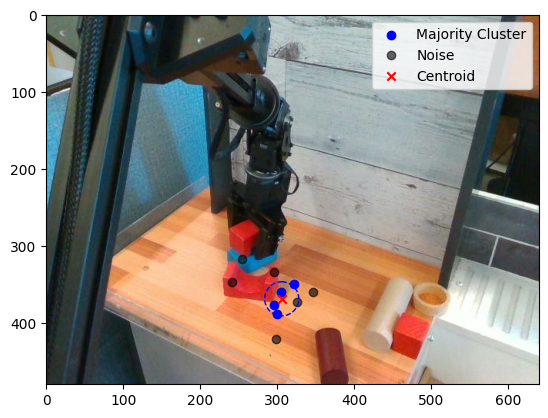

Didnt find any cluster
Task: 2
pick up vegetable and put it on the table.
Number of clusters: 1
Number of noisy points: 5
Centroid of majority cluster: [247.6 292.4]
Diameter of majority cluster: 27.892651361962706


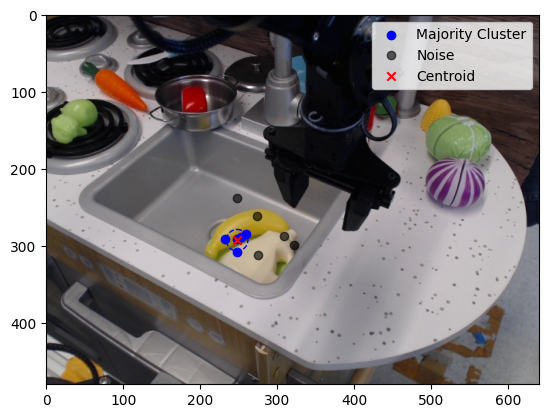

Didnt find any cluster
Task: 3
pick up glass cup
Didnt find any cluster
Task: 4
pick up red srewdriver
Didnt find any cluster
Task: 5
pick up the bean.
Number of clusters: 1
Number of noisy points: 6
Centroid of majority cluster: [324.25 263.75]
Diameter of majority cluster: 13.92838827718412


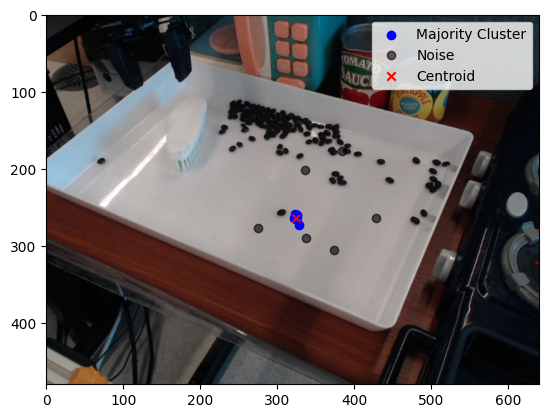

Task: 6
pick up the diamond.
Didnt find any cluster
Task: 7
pick up vegetable and put it on the green cutting board.
Didnt find any cluster
Didnt find any cluster
Task: 8
pick up cloth.
Didnt find any cluster
Task: 9
pick up vegetable from the sink and put it on the right side of the sink.
Number of clusters: 1
Number of noisy points: 7
Centroid of majority cluster: [349.33333333 404.        ]
Diameter of majority cluster: 12.206555615733702


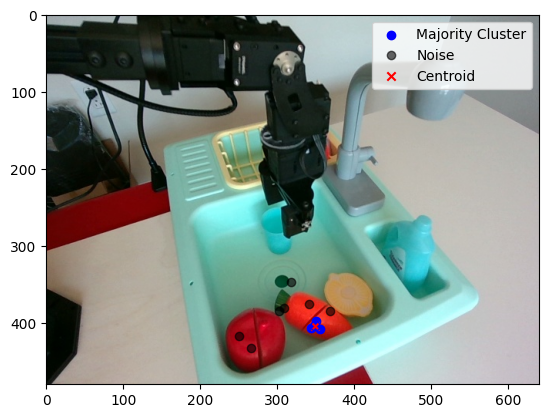

Number of clusters: 1
Number of noisy points: 7
Centroid of majority cluster: [479.33333333 300.        ]
Diameter of majority cluster: 16.1245154965971


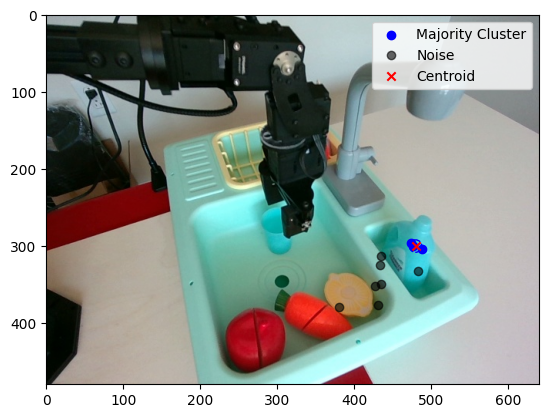

Task: 10
pick up the can and put it next to the tomato.
Number of clusters: 1
Number of noisy points: 7
Centroid of majority cluster: [123.33333333 274.        ]
Diameter of majority cluster: 25.079872407968907


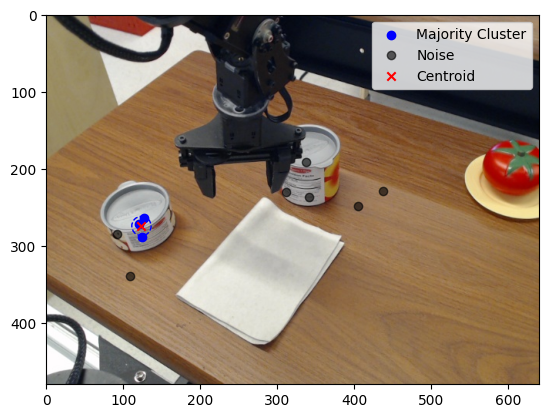

Number of clusters: 1
Number of noisy points: 3
Centroid of majority cluster: [582.28571429 223.        ]
Diameter of majority cluster: 51.73973328110612


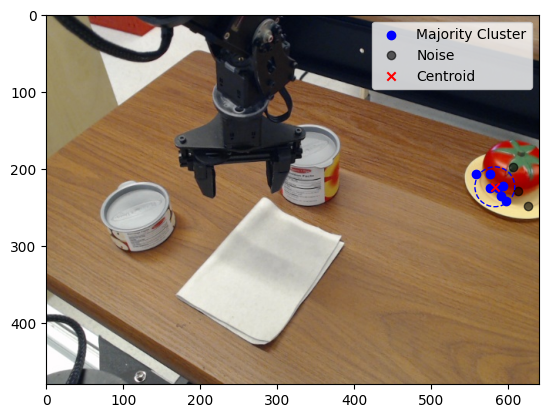

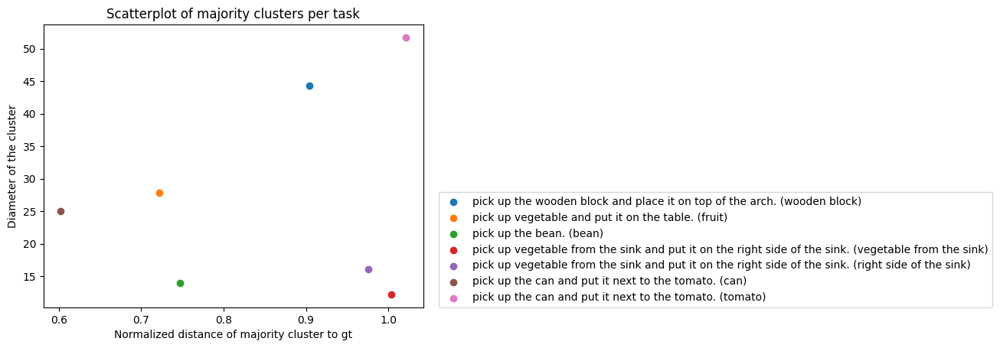

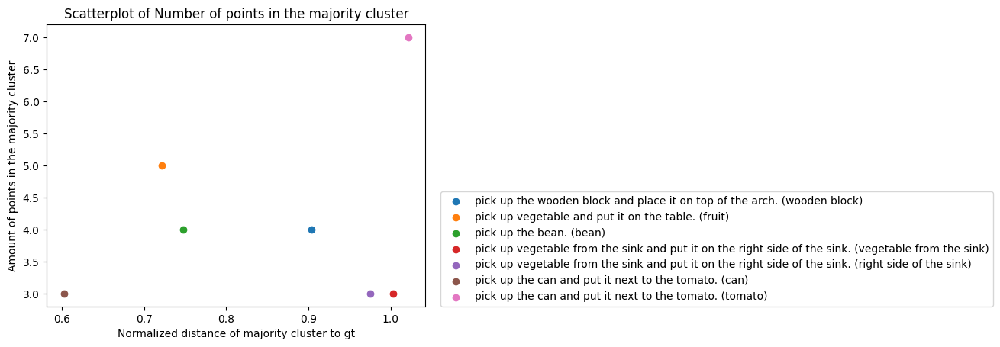

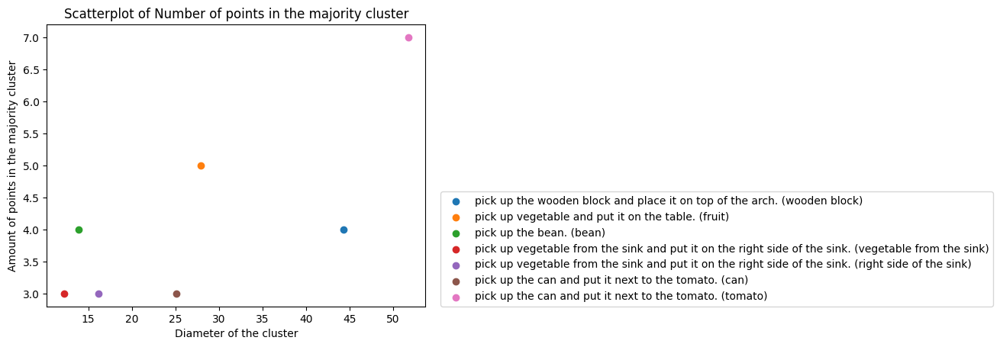

In [5]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the ",
    "Identify multiple points within the space of the ",
    "Identify several points within the area of the ",
    "Identify several spots within the space of the "
]

TEMPERATURES = [
    0.6
]


run_cluster_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 2,
    epsilon = 20,
    min_samples = 3,
    experiment_path = "../data/uncertain_experiments"
)

Task: 1
pull the oven tray
Number of clusters: 1
Number of noisy points: 7
Centroid of majority cluster: [208.125 138.375]
Diameter of majority cluster: 16.64331697709324


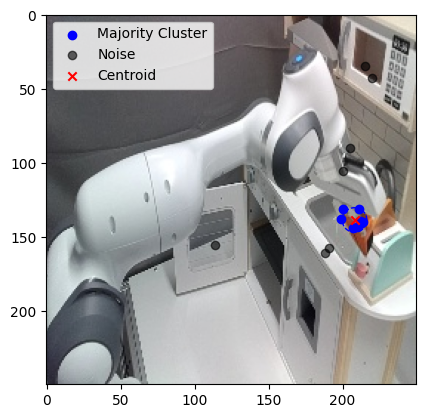

Task: 2
move the fruit from the left stove to the sink
Number of clusters: 2
Number of noisy points: 0
Centroid of majority cluster: [125.875 207.875]
Diameter of majority cluster: 23.40939982143925


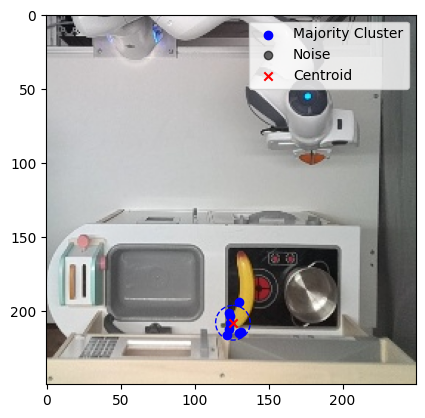

Number of clusters: 2
Number of noisy points: 0
Centroid of majority cluster: [127.08333333 211.58333333]
Diameter of majority cluster: 62.96824596572466


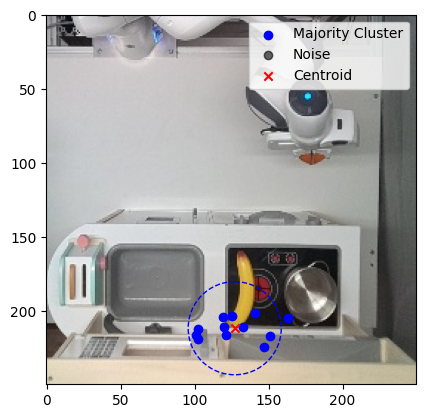

Task: 3
open low fridge
Number of clusters: 1
Number of noisy points: 5
Centroid of majority cluster: [305.4  83.3]
Diameter of majority cluster: 49.20365840057018


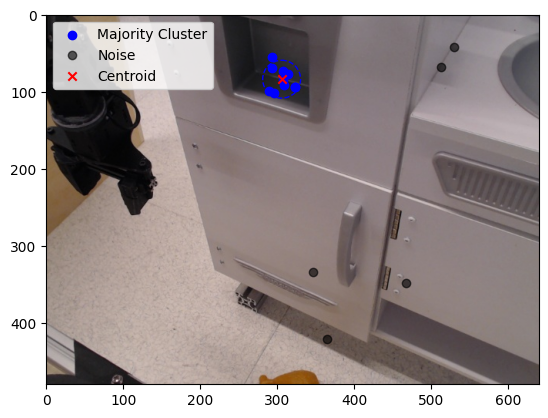

Task: 4
open the drawer
Number of clusters: 2
Number of noisy points: 7
Centroid of majority cluster: [108.5  171.25]
Diameter of majority cluster: 20.09975124224178


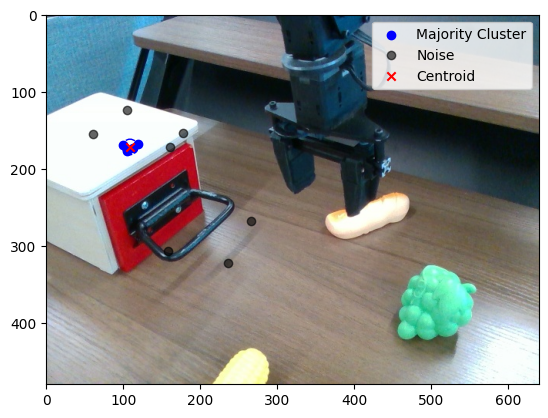

Task: 5
Move the can from the top left of the burner to the bottom left of the burner
Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [178.85714286 117.14285714]
Diameter of majority cluster: 47.16990566028302


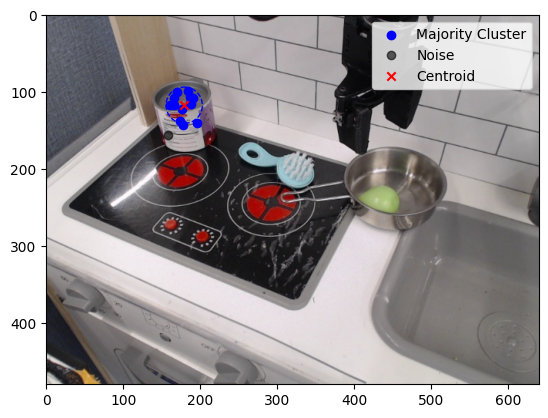

Number of clusters: 2
Number of noisy points: 9
Centroid of majority cluster: [126.66666667 270.33333333]
Diameter of majority cluster: 21.095023109728988


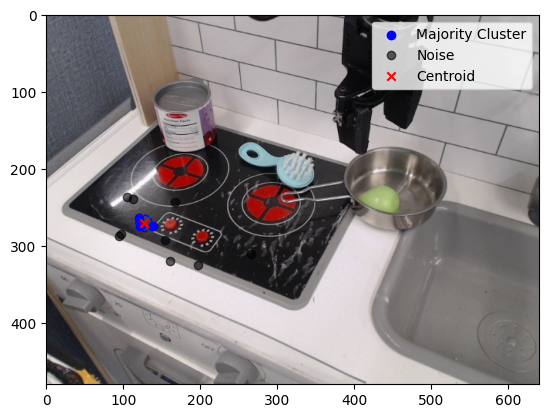

Task: 6
Place the pot to the right of the blue fork.
Number of clusters: 1
Number of noisy points: 4
Centroid of majority cluster: [300.09090909 160.18181818]
Diameter of majority cluster: 51.478150704935004


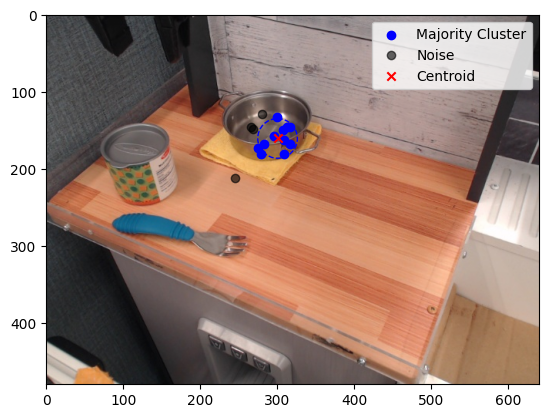

Number of clusters: 1
Number of noisy points: 9
Centroid of majority cluster: [342.33333333 251.33333333]
Diameter of majority cluster: 34.20526275297414


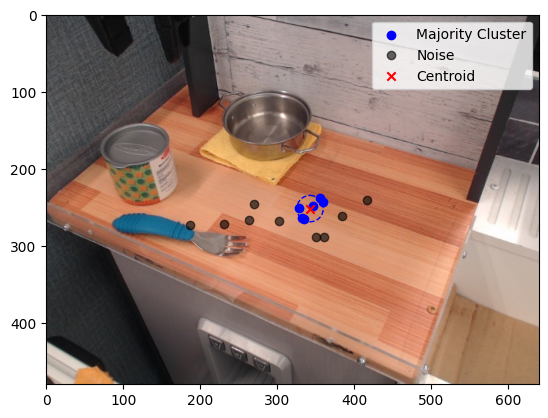

Task: 7
move the pot from the right to the left stove
Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [180.85714286 206.71428571]
Diameter of majority cluster: 32.31098884280702


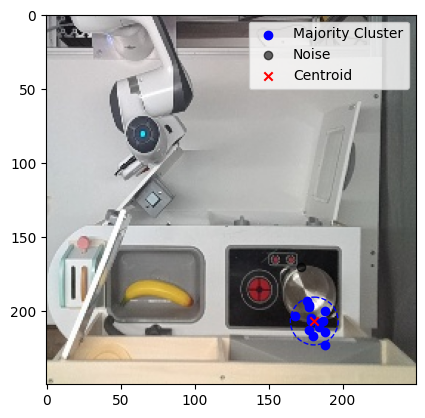

Number of clusters: 1
Number of noisy points: 3
Centroid of majority cluster: [ 78.83333333 205.66666667]
Diameter of majority cluster: 48.91829923454004


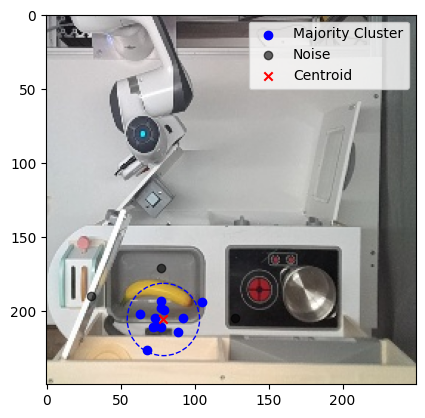

Task: 8
put potato in pot or pan
Number of clusters: 2
Number of noisy points: 7
Centroid of majority cluster: [306.  136.4]
Diameter of majority cluster: 31.622776601683793


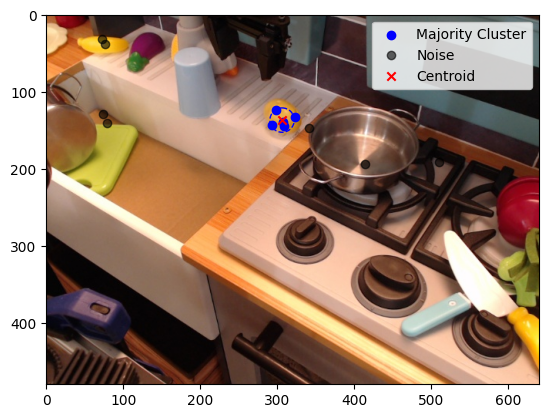

Number of clusters: 1
Number of noisy points: 6
Centroid of majority cluster: [400.77777778 209.22222222]
Diameter of majority cluster: 53.600373133029585


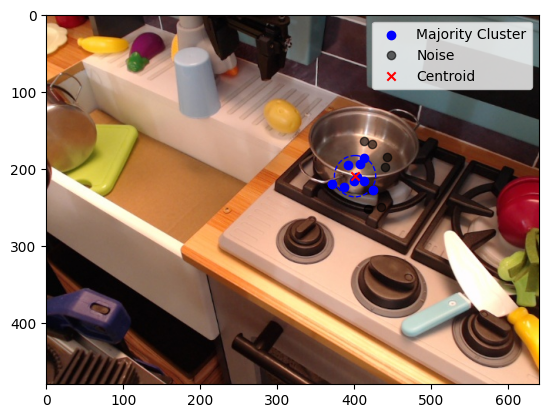

Task: 9
take cucumber out of cup
Number of clusters: 1
Number of noisy points: 2
Centroid of majority cluster: [261.30769231 348.92307692]
Diameter of majority cluster: 72.00694410957877


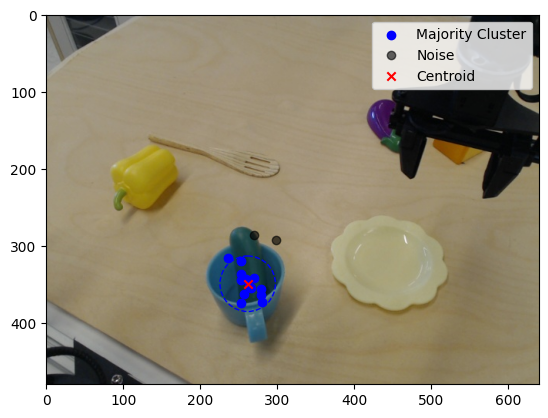

Task: 10
move the banana from the left stove to the sink
Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [131.78571429 212.71428571]
Diameter of majority cluster: 40.311288741492746


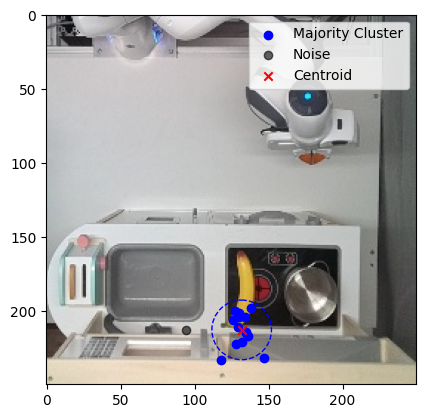

Number of clusters: 2
Number of noisy points: 1
Centroid of majority cluster: [130.         220.90909091]
Diameter of majority cluster: 70.06425622241343


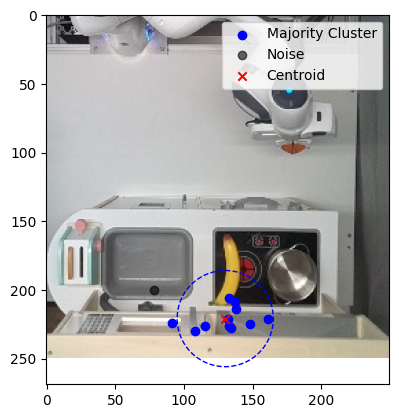

Task: 11
pick up the toast and put it to the sink
Number of clusters: 1
Number of noisy points: 11
Centroid of majority cluster: [ 55.5 206. ]
Diameter of majority cluster: 24.166091947189145


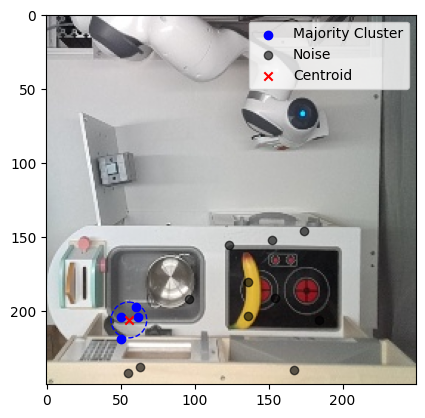

Number of clusters: 1
Number of noisy points: 1
Centroid of majority cluster: [ 73.42857143 202.21428571]
Diameter of majority cluster: 52.839379254491625


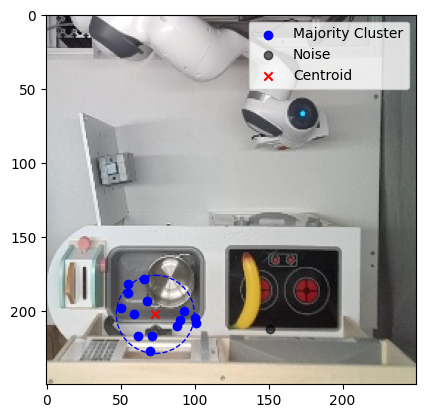

Task: 12
close the microwave
Number of clusters: 1
Number of noisy points: 3
Centroid of majority cluster: [163.91666667  88.75      ]
Diameter of majority cluster: 36.796738985948195


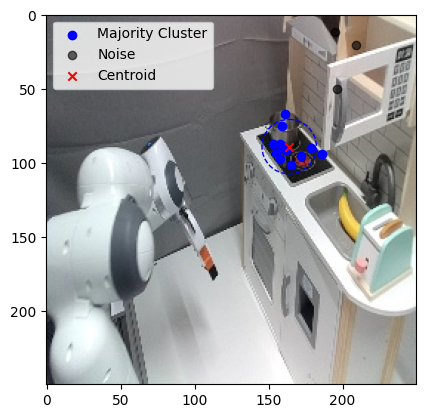

Task: 13
push the toaster lever
Number of clusters: 2
Number of noisy points: 8
Centroid of majority cluster: [ 78.5 232. ]
Diameter of majority cluster: 18.384776310850235


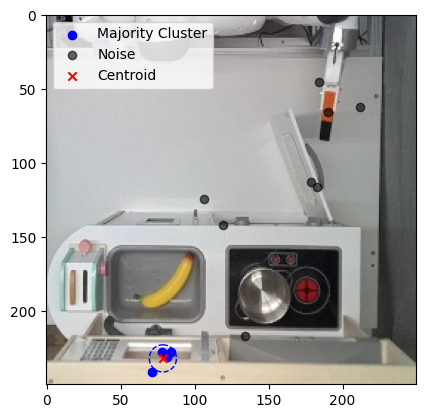

Task: 14
pick up glass cup
Number of clusters: 1
Number of noisy points: 12
Centroid of majority cluster: [271.33333333 241.        ]
Diameter of majority cluster: 23.853720883753127


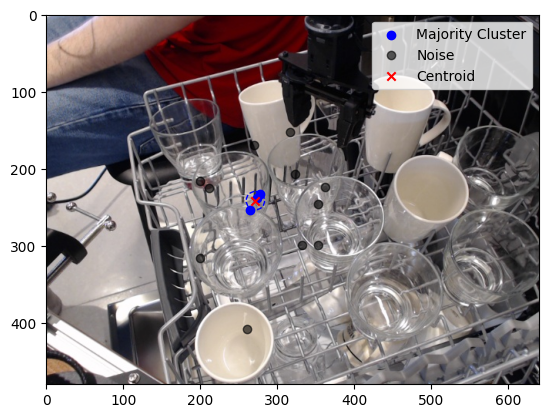

Task: 15
take the broccoli and put it between the two right burners
Didnt find any cluster
Number of clusters: 2
Number of noisy points: 5
Centroid of majority cluster: [271.42857143 243.        ]
Diameter of majority cluster: 34.17601498127012


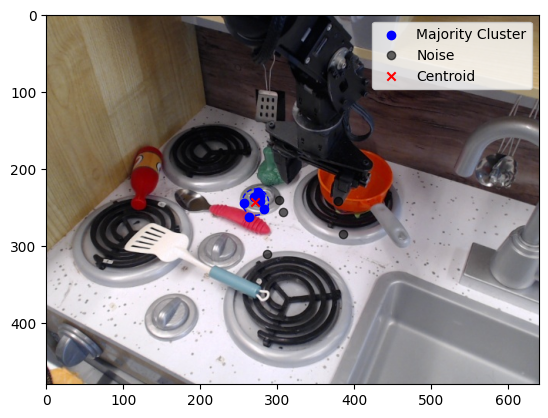

Task: 16
move the pot from the left to the right stove
Number of clusters: 1
Number of noisy points: 0
Centroid of majority cluster: [160.73333333  80.6       ]
Diameter of majority cluster: 19.209372712298546


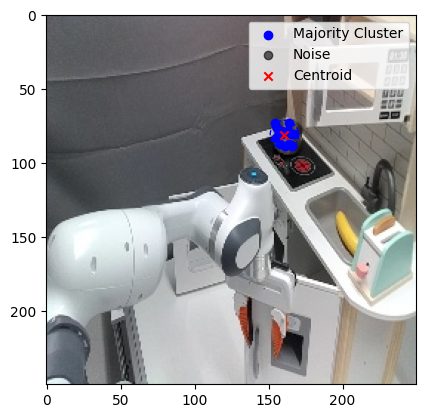

Number of clusters: 1
Number of noisy points: 2
Centroid of majority cluster: [165.46153846 103.84615385]
Diameter of majority cluster: 24.73863375370596


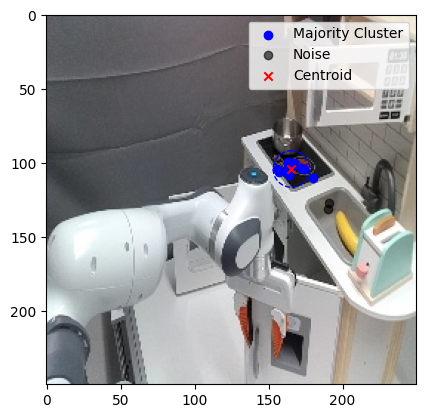

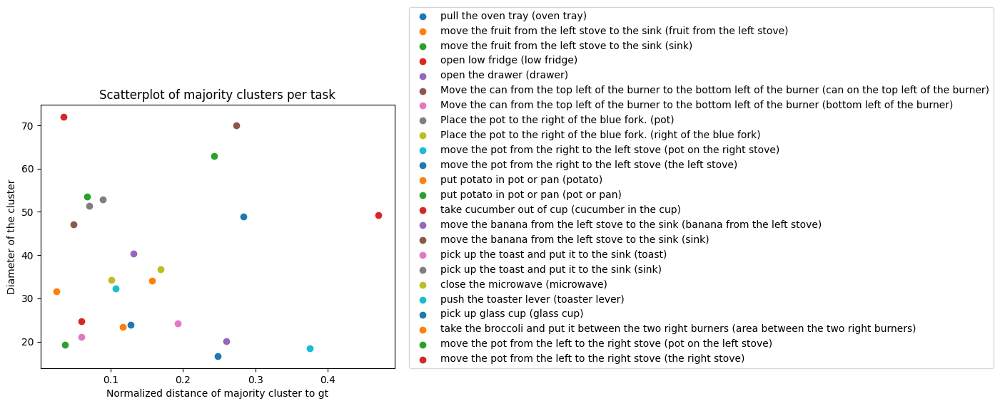

In [6]:
PROMPTS = [
    "Locate several points within the space of the ",
    "Locate several points within the area of the ",
    "Identify multiple points within the space of the ",
    "Identify several points within the area of the ",
    "Identify several spots within the space of the "
]

TEMPERATURES = [
    0.6
]


run_cluster_experiment(
    prompts = PROMPTS,
    temperatures = TEMPERATURES,
    runs_per_instance = 3,
    epsilon = 20,
    min_samples = 3,
    experiment_path = "../data/base_experiments"
)

In [ ]:
close_all_images("../data")